## FINAL PROJECT

In [1]:
import pandas as pd
import numpy as np
import os
import seaborn as sns

import keras
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
# from sklearn.neighbor import KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier
from tensorflow.keras.models import Sequential

from sklearn.linear_model import LinearRegression
from sklearn.svm import SVC
from collections.abc import Sequence
from sklearn import preprocessing
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

from scipy import stats
from scipy.stats import norm, skew
import statsmodels.api as sm


from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from pandas import Interval

from sklearn import metrics
import tensorflow as tf
from keras.models import Sequential
from keras.layers.core import Dense, Activation
from keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint

In [2]:
# Encode text values to dummy variables(i.e. [1,0,0],[0,1,0],[0,0,1] for red,green,blue)
def encode_text_dummy(df, name):
    dummies = pd.get_dummies(df[name])
    for x in dummies.columns:
        dummy_name = "{}-{}".format(name, x)
        df[dummy_name] = dummies[x]
    df.drop(name, axis=1, inplace=True)


# Encode text values to indexes(i.e. [1],[2],[3] for red,green,blue).
def encode_text_index(df, name):
    le = preprocessing.LabelEncoder()
    df[name] = le.fit_transform(df[name])
    return le.classes_


# Encode a numeric column as zscores
def encode_numeric_zscore(df, name, mean=None, sd=None):
    if mean is None:
        mean = df[name].mean()

    if sd is None:
        sd = df[name].std()

    df[name] = (df[name] - mean) / sd


# Convert all missing values in the specified column to the median
def missing_median(df, name):
    med = df[name].median()
    df[name] = df[name].fillna(med)


# Convert all missing values in the specified column to the default
def missing_default(df, name, default_value):
    df[name] = df[name].fillna(default_value)


# Convert a Pandas dataframe to the x,y inputs that TensorFlow needs
def to_xy(df, target):
    result = []
    for x in df.columns:
        if x != target:
            result.append(x)
    # find out the type of the target column. 
    target_type = df[target].dtypes
    target_type = target_type[0] if isinstance(target_type, Sequence) else target_type
    # Encode to int for classification, float otherwise. TensorFlow likes 32 bits.
    if target_type in (np.int64, np.int32):
        # Classification
        dummies = pd.get_dummies(df[target])
        return df[result].values.astype(np.float32), dummies.values.astype(np.float32)
    else:
        # Regression
        return df[result].values.astype(np.float32), df[target].values.astype(np.float32)

# Nicely formatted time string
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return "{}:{:>02}:{:>05.2f}".format(h, m, s)


# Regression chart.
def chart_regression(pred,y,sort=True):
    t = pd.DataFrame({'pred' : pred, 'y' : y.flatten()})
    if sort:
        t.sort_values(by=['y'],inplace=True)
    a = plt.plot(t['y'].tolist(),label='expected')
    b = plt.plot(t['pred'].tolist(),label='prediction')
    plt.ylabel('output')
    plt.legend()
    plt.show()

# Remove all rows where the specified column is +/- sd standard deviations
def remove_outliers(df, name, sd):
    drop_rows = df.index[(np.abs(df[name] - df[name].mean()) >= (sd * df[name].std()))]
    df.drop(drop_rows, axis=0, inplace=True)


# Encode a column to a range between normalized_low and normalized_high.
def encode_numeric_range(df, name, normalized_low=-1, normalized_high=1,
                         data_low=None, data_high=None):
    if data_low is None:
        data_low = min(df[name])
        data_high = max(df[name])

    df[name] = ((df[name] - data_low) / (data_high - data_low)) \
               * (normalized_high - normalized_low) + normalized_low

In [3]:
property_data = pd.read_csv("Property_Sale_transactions.csv",low_memory=False)

In [4]:
property_data.head()
# print(property_data.shape)


,PARID,PROPERTYHOUSENUM,PROPERTYFRACTION,PROPERTYADDRESSDIR,PROPERTYADDRESSSTREET,PROPERTYADDRESSSUF,PROPERTYADDRESSUNITDESC,PROPERTYUNITNO,PROPERTYCITY,PROPERTYSTATE,...,MUNIDESC,RECORDDATE,SALEDATE,PRICE,DEEDBOOK,DEEDPAGE,SALECODE,SALEDESC,INSTRTYP,INSTRTYPDESC
0,1075F00108000000,4720.0,,NaN,HIGHPOINT,DR,NaN,NaN,GIBSONIA,PA,...,Hampton,2012-09-27,2012-09-27,120000.0,15020,356,3,LOVE AND AFFECTION SALE,DE,DEED
1,0011A00237000000,0.0,,NaN,LOMBARD,ST,NaN,NaN,PITTSBURGH,PA,...,3rd Ward - PITTSBURGH,2015-01-06,2015-01-06,1783.0,TR15,00002,2,CITY TREASURER SALE,TS,TREASURER DEED
2,0011J00047000000,1903.0,,NaN,FORBES,AVE,NaN,NaN,PITTSBURGH,PA,...,1st Ward - PITTSBURGH,2012-10-26,2012-10-26,4643.0,TR13,003,2,CITY TREASURER SALE,TS,TREASURER DEED
3,0113B00029000000,479.0,,NaN,ROOSEVELT,AVE,NaN,NaN,PITTSBURGH,PA,...,Bellevue,2017-03-27,2017-03-06,0.0,16739,166,3,LOVE AND AFFECTION SALE,CO,CORRECTIVE DEED
4,0119S00024000000,5418.0,,NaN,CARNEGIE,ST,NaN,NaN,PITTSBURGH,PA,...,10th Ward - PITTSBURGH,2015-02-04,2015-02-04,27541.0,TR15,00059,GV,GOVERNMENT SALE,TS,TREASURER DEED


In [5]:

property_data.shape

(305133, 24)

In [6]:
property_data.dtypes

PARID                       object
PROPERTYHOUSENUM           float64
PROPERTYFRACTION            object
PROPERTYADDRESSDIR          object
PROPERTYADDRESSSTREET       object
PROPERTYADDRESSSUF          object
PROPERTYADDRESSUNITDESC     object
PROPERTYUNITNO              object
PROPERTYCITY                object
PROPERTYSTATE               object
PROPERTYZIP                float64
SCHOOLCODE                   int64
SCHOOLDESC                  object
MUNICODE                     int64
MUNIDESC                    object
RECORDDATE                  object
SALEDATE                    object
PRICE                      float64
DEEDBOOK                    object
DEEDPAGE                    object
SALECODE                    object
SALEDESC                    object
INSTRTYP                    object
INSTRTYPDESC                object
dtype: object

In [7]:
# It has 24 columns. Looking in at details of the columns
property_data.info()
# property_data.dtypes


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 305133 entries, 0 to 305132
Data columns (total 24 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   PARID                    305133 non-null  object 
 1   PROPERTYHOUSENUM         305115 non-null  float64
 2   PROPERTYFRACTION         305133 non-null  object 
 3   PROPERTYADDRESSDIR       12533 non-null   object 
 4   PROPERTYADDRESSSTREET    305125 non-null  object 
 5   PROPERTYADDRESSSUF       303775 non-null  object 
 6   PROPERTYADDRESSUNITDESC  5918 non-null    object 
 7   PROPERTYUNITNO           6100 non-null    object 
 8   PROPERTYCITY             305132 non-null  object 
 9   PROPERTYSTATE            305133 non-null  object 
 10  PROPERTYZIP              305132 non-null  float64
 11  SCHOOLCODE               305133 non-null  int64  
 12  SCHOOLDESC               305133 non-null  object 
 13  MUNICODE                 305133 non-null  int64  
 14  MUNI

In [8]:
property_data.describe()

,PROPERTYHOUSENUM,PROPERTYZIP,SCHOOLCODE,MUNICODE,PRICE
count,305115.000000,305132.000000,305133.000000,305133.000000,3.026680e+05
mean,1440.080724,15169.649817,29.004093,688.491222,1.723614e+05
std,2064.056384,92.790514,15.067675,340.670623,9.771933e+05
min,0.000000,15003.000000,1.000000,101.000000,0.000000e+00
25%,159.000000,15108.000000,17.000000,202.000000,5.000000e+02
50%,603.000000,15204.000000,29.000000,874.000000,7.530000e+04
75%,1812.000000,15221.000000,46.000000,927.000000,1.850000e+05
max,39389.000000,16229.000000,50.000000,953.000000,1.487529e+08


In [9]:
# sns.distplot(property_data['PRICE'])

In [10]:
len(property_data.PARID.unique())
print("Duplicates in id column: ",property_data.PARID.duplicated().sum())

Duplicates in id column:  87015


In [11]:
print(property_data.isnull().sum(axis = 0))

PARID                           0
PROPERTYHOUSENUM               18
PROPERTYFRACTION                0
PROPERTYADDRESSDIR         292600
PROPERTYADDRESSSTREET           8
PROPERTYADDRESSSUF           1358
PROPERTYADDRESSUNITDESC    299215
PROPERTYUNITNO             299033
PROPERTYCITY                    1
PROPERTYSTATE                   0
PROPERTYZIP                     1
SCHOOLCODE                      0
SCHOOLDESC                      0
MUNICODE                        0
MUNIDESC                        0
RECORDDATE                   1226
SALEDATE                        0
PRICE                        2465
DEEDBOOK                      316
DEEDPAGE                      326
SALECODE                        0
SALEDESC                        0
INSTRTYP                        0
INSTRTYPDESC                    0
dtype: int64


In [12]:
# property_data = property_data.drop_duplicates(keep='first',inplace=False)
property_data.drop_duplicates(['PARID'],inplace=False)
print(property_data.shape)

(305133, 24)


In [13]:
property_data['SCHOOLDESC'] = property_data["SCHOOLCODE"].astype(str) +" "+ property_data["SCHOOLDESC"]
property_data['MUNIDESC'] =  property_data["MUNICODE"].astype(str) +" "+ property_data["MUNIDESC"]

In [14]:
# We have dropped duplicates in the id column.
# We have to determine which columns are useful.
# from above info columns that contains Null 
property_data_null =["PROPERTYADDRESSDIR","PROPERTYADDRESSUNITDESC","PROPERTYUNITNO"]

# Columns related to deed book and which do not contribute to the objective i.e  Columns Not Required
property_data_deed = ["DEEDBOOK","DEEDPAGE","RECORDDATE","INSTRTYP","INSTRTYPDESC"]

# Columns which have description about the code i.e: school desc is a feature describing about the school code. These features can be looked up by 
# using the school code
property_data_desc = ["SCHOOLDESC","MUNIDESC"]

# dropping unwanted fields
property_data = property_data.drop(columns = ["PROPERTYADDRESSDIR","PROPERTYADDRESSUNITDESC","PROPERTYUNITNO"])
property_data = property_data.drop(columns = ["DEEDBOOK","DEEDPAGE","RECORDDATE","INSTRTYP","INSTRTYPDESC"])
property_data = property_data.drop(columns = ["SCHOOLCODE","MUNICODE"])
property_data = property_data.drop(columns = ["PROPERTYFRACTION","PROPERTYADDRESSSUF","PROPERTYSTATE"])


In [15]:
print(property_data.shape)

(305133, 11)


In [16]:
property_data.head()

,PARID,PROPERTYHOUSENUM,PROPERTYADDRESSSTREET,PROPERTYCITY,PROPERTYZIP,SCHOOLDESC,MUNIDESC,SALEDATE,PRICE,SALECODE,SALEDESC
0,1075F00108000000,4720.0,HIGHPOINT,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-09-27,120000.0,3,LOVE AND AFFECTION SALE
1,0011A00237000000,0.0,LOMBARD,PITTSBURGH,15219.0,47 Pittsburgh,103 3rd Ward - PITTSBURGH,2015-01-06,1783.0,2,CITY TREASURER SALE
2,0011J00047000000,1903.0,FORBES,PITTSBURGH,15219.0,47 Pittsburgh,101 1st Ward - PITTSBURGH,2012-10-26,4643.0,2,CITY TREASURER SALE
3,0113B00029000000,479.0,ROOSEVELT,PITTSBURGH,15202.0,29 Northgate,803 Bellevue,2017-03-06,0.0,3,LOVE AND AFFECTION SALE
4,0119S00024000000,5418.0,CARNEGIE,PITTSBURGH,15201.0,47 Pittsburgh,110 10th Ward - PITTSBURGH,2015-02-04,27541.0,GV,GOVERNMENT SALE


In [17]:
property_data = property_data.drop_duplicates(keep='first',inplace=False)

In [18]:
property_data.shape

(304302, 11)

In [19]:
property_data['PRICE'].value_counts()

1.0         59155
0.0         10083
10.0         4339
150000.0     1766
125000.0     1627
            ...  
127250.0        1
500379.0        1
11513.0         1
368425.0        1
123899.0        1
Name: PRICE, Length: 28146, dtype: int64

In [20]:
len(property_data.PROPERTYZIP.unique())

119

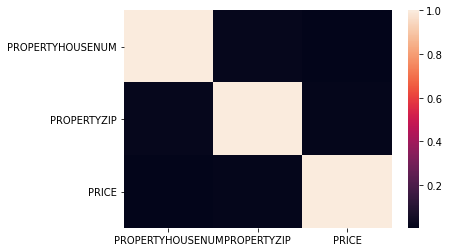

In [21]:

# corr = property_data.corr()
# sns.heatmap(corr)

sns.heatmap(property_data.corr())

In [22]:
# prop_test = property_data.copy()

In [23]:
# # prop_test.PRICE.replace([np.inf, -np.inf], np.nan, inplace=True) 

# count = 0
# if (prop_test.PRICE == np.inf) | (prop_test.PRICE == -np.inf):
#     count += 1
# print(count)    

In [24]:
# #we use log function which is in numpy
# prop_test['PRICE'] = np.log1p(prop_test['PRICE'])
# print("one")
# #Check again for more normal distribution

# plt.subplots(figsize=(12,9))
# sns.distplot(prop_test['PRICE'], fit=stats.norm)
# print("two")

# # Get the fitted parameters used by the function

# (mu, sigma) = stats.norm.fit(prop_test['PRICE'])
# # print("three")
# # plot with the distribution

# plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
# plt.ylabel('Frequency')

# #Probablity plot

# fig = plt.figure()
# stats.probplot(prop_test['PRICE'], plot=plt)
# plt.show()

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

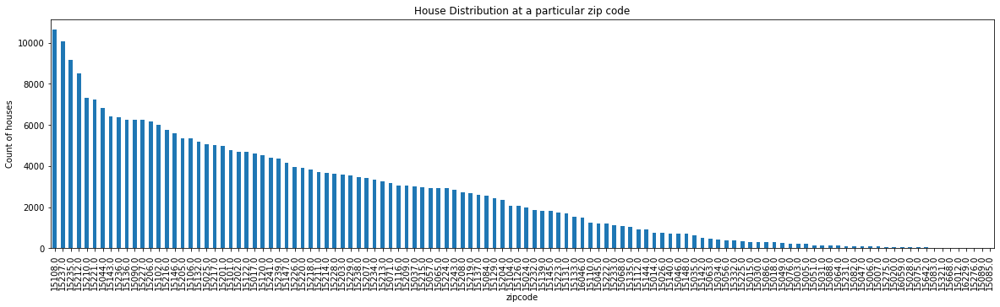

In [25]:
plt.figure(figsize=(20,5))

property_data['PROPERTYZIP'].value_counts().plot(kind='bar')
plt.title('House Distribution at a particular zip code')
plt.xlabel('zipcode')
plt.ylabel('Count of houses')
sns.despine

In [26]:
#Handling outliers
final = property_data['PROPERTYZIP'].value_counts(ascending=True).rename_axis('zip codes counts')
print(final.shape)
print(property_data.shape)

final = final.iloc[60:]
print(final.shape)
final

# list_zip = final['zip codes'].tolist()
# print(list_zip.dtype)

(118,)
(304302, 11)
(58,)


zip codes counts
15104.0     2075
15204.0     2345
15129.0     2418
15084.0     2539
15137.0     2595
15219.0     2692
15208.0     2721
15243.0     2857
15224.0     2921
15065.0     2935
15057.0     2935
15215.0     2985
15037.0     3013
15209.0     3032
15116.0     3038
15071.0     3160
15213.0     3237
15234.0     3342
15207.0     3418
15238.0     3451
15229.0     3521
15203.0     3582
15228.0     3624
15214.0     3679
15211.0     3691
15218.0     3827
15220.0     3906
15226.0     3938
15147.0     4142
15239.0     4345
15241.0     4403
15120.0     4520
15017.0     4614
15122.0     4668
15202.0     4680
15101.0     4770
15201.0     4986
15217.0     5012
15025.0     5056
15132.0     5166
15106.0     5349
15205.0     5354
15146.0     5585
15216.0     5763
15102.0     6007
15206.0     6166
15227.0     6245
15090.0     6262
15136.0     6265
15236.0     6356
15143.0     6431
15044.0     6828
15221.0     7230
15210.0     7325
15212.0     8515
15235.0     9165
15237.0    10075
15108.0    106

In [27]:
final

zip codes counts
15104.0     2075
15204.0     2345
15129.0     2418
15084.0     2539
15137.0     2595
15219.0     2692
15208.0     2721
15243.0     2857
15224.0     2921
15065.0     2935
15057.0     2935
15215.0     2985
15037.0     3013
15209.0     3032
15116.0     3038
15071.0     3160
15213.0     3237
15234.0     3342
15207.0     3418
15238.0     3451
15229.0     3521
15203.0     3582
15228.0     3624
15214.0     3679
15211.0     3691
15218.0     3827
15220.0     3906
15226.0     3938
15147.0     4142
15239.0     4345
15241.0     4403
15120.0     4520
15017.0     4614
15122.0     4668
15202.0     4680
15101.0     4770
15201.0     4986
15217.0     5012
15025.0     5056
15132.0     5166
15106.0     5349
15205.0     5354
15146.0     5585
15216.0     5763
15102.0     6007
15206.0     6166
15227.0     6245
15090.0     6262
15136.0     6265
15236.0     6356
15143.0     6431
15044.0     6828
15221.0     7230
15210.0     7325
15212.0     8515
15235.0     9165
15237.0    10075
15108.0    106

In [28]:
property_data=property_data.merge(final , left_on='PROPERTYZIP', right_on='zip codes counts')


In [29]:
property_data.head()

,PARID,PROPERTYHOUSENUM,PROPERTYADDRESSSTREET,PROPERTYCITY,PROPERTYZIP_x,SCHOOLDESC,MUNIDESC,SALEDATE,PRICE,SALECODE,SALEDESC,PROPERTYZIP_y
0,1075F00108000000,4720.0,HIGHPOINT,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-09-27,120000.0,3,LOVE AND AFFECTION SALE,6828
1,1510N00180000000,0.0,MOUNTAIN VIEW,GIBSONIA,15044.0,12 Deer Lakes,952 West Deer,2013-09-12,25000.0,99,CORRECTIVE DEED / DUPLICATE SALE,6828
2,1505G00023000000,109.0,WALCOTT,GIBSONIA,15044.0,3 Pine-Richland,938 Richland,2012-05-24,1.0,3,LOVE AND AFFECTION SALE,6828
3,1507P00003000E00,204.0,CARTERS GROVE,GIBSONIA,15044.0,3 Pine-Richland,938 Richland,2014-05-22,104000.0,99,CORRECTIVE DEED / DUPLICATE SALE,6828
4,2003N00005000000,122.0,SUMMER,GIBSONIA,15044.0,3 Pine-Richland,935 Pine,2012-05-23,711000.0,ND,OTHER,6828


In [30]:
property_data=property_data.drop(columns=["PROPERTYZIP_y"])
property_data=property_data.rename(columns={'PROPERTYZIP_x': 'PROPERTYZIP'})

In [31]:
property_data.head()

,PARID,PROPERTYHOUSENUM,PROPERTYADDRESSSTREET,PROPERTYCITY,PROPERTYZIP,SCHOOLDESC,MUNIDESC,SALEDATE,PRICE,SALECODE,SALEDESC
0,1075F00108000000,4720.0,HIGHPOINT,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-09-27,120000.0,3,LOVE AND AFFECTION SALE
1,1510N00180000000,0.0,MOUNTAIN VIEW,GIBSONIA,15044.0,12 Deer Lakes,952 West Deer,2013-09-12,25000.0,99,CORRECTIVE DEED / DUPLICATE SALE
2,1505G00023000000,109.0,WALCOTT,GIBSONIA,15044.0,3 Pine-Richland,938 Richland,2012-05-24,1.0,3,LOVE AND AFFECTION SALE
3,1507P00003000E00,204.0,CARTERS GROVE,GIBSONIA,15044.0,3 Pine-Richland,938 Richland,2014-05-22,104000.0,99,CORRECTIVE DEED / DUPLICATE SALE
4,2003N00005000000,122.0,SUMMER,GIBSONIA,15044.0,3 Pine-Richland,935 Pine,2012-05-23,711000.0,ND,OTHER


In [32]:
property_data.shape

(269378, 11)

In [33]:
len(property_data.PROPERTYADDRESSSTREET.unique())

8483

In [34]:
property_data.shape

(269378, 11)

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

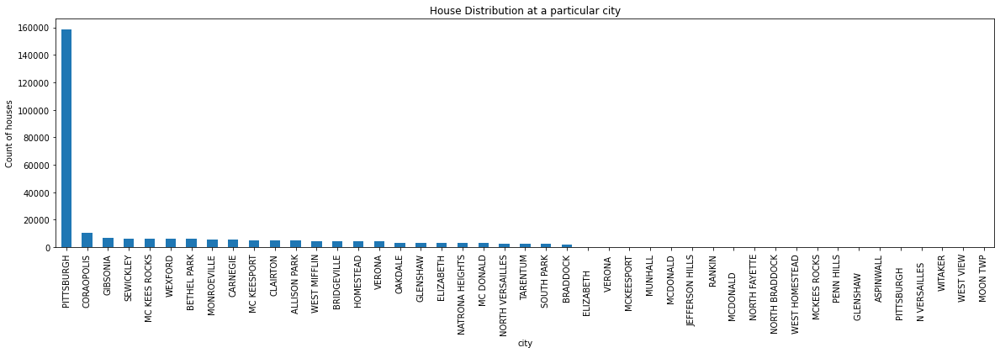

In [35]:
plt.figure(figsize=(20,5))

property_data['PROPERTYCITY'].value_counts().plot(kind='bar')
plt.title('House Distribution at a particular city')
plt.xlabel('city')
plt.ylabel('Count of houses')
sns.despine

In [36]:
final_city = property_data['PROPERTYCITY'].value_counts(ascending = True).rename_axis('city')
print(final_city.shape)
print(property_data.shape)

final_city.head(20)

final_city = final_city.iloc[20:]
print(final_city.shape)


(45,)
(269378, 11)
(25,)


In [37]:
final_city

city
BRADDOCK              2064
SOUTH PARK            2418
TARENTUM              2539
NORTH VERSAILLES      2594
MC DONALD             2920
NATRONA HEIGHTS       2935
ELIZABETH             2936
GLENSHAW              3036
OAKDALE               3171
VERONA                4121
HOMESTEAD             4502
BRIDGEVILLE           4603
WEST MIFFLIN          4668
ALLISON PARK          4770
CLAIRTON              5048
MC KEESPORT           5150
CARNEGIE              5349
MONROEVILLE           5585
BETHEL PARK           6007
WEXFORD               6200
MC KEES ROCKS         6261
SEWICKLEY             6431
GIBSONIA              6893
CORAOPOLIS           10613
PITTSBURGH          158380
Name: PROPERTYCITY, dtype: int64

In [38]:
property_data=property_data.merge(final_city , left_on='PROPERTYCITY', right_on='city')


In [39]:
property_data.head()

,PARID,PROPERTYHOUSENUM,PROPERTYADDRESSSTREET,PROPERTYCITY_x,PROPERTYZIP,SCHOOLDESC,MUNIDESC,SALEDATE,PRICE,SALECODE,SALEDESC,PROPERTYCITY_y
0,1075F00108000000,4720.0,HIGHPOINT,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-09-27,120000.0,3,LOVE AND AFFECTION SALE,6893
1,1510N00180000000,0.0,MOUNTAIN VIEW,GIBSONIA,15044.0,12 Deer Lakes,952 West Deer,2013-09-12,25000.0,99,CORRECTIVE DEED / DUPLICATE SALE,6893
2,1505G00023000000,109.0,WALCOTT,GIBSONIA,15044.0,3 Pine-Richland,938 Richland,2012-05-24,1.0,3,LOVE AND AFFECTION SALE,6893
3,1507P00003000E00,204.0,CARTERS GROVE,GIBSONIA,15044.0,3 Pine-Richland,938 Richland,2014-05-22,104000.0,99,CORRECTIVE DEED / DUPLICATE SALE,6893
4,2003N00005000000,122.0,SUMMER,GIBSONIA,15044.0,3 Pine-Richland,935 Pine,2012-05-23,711000.0,ND,OTHER,6893


In [40]:
property_data=property_data.drop(columns=["PROPERTYCITY_y"])
property_data=property_data.rename(columns={'PROPERTYCITY_x': 'PROPERTYCITY'})

In [41]:
property_data.shape

(269194, 11)

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

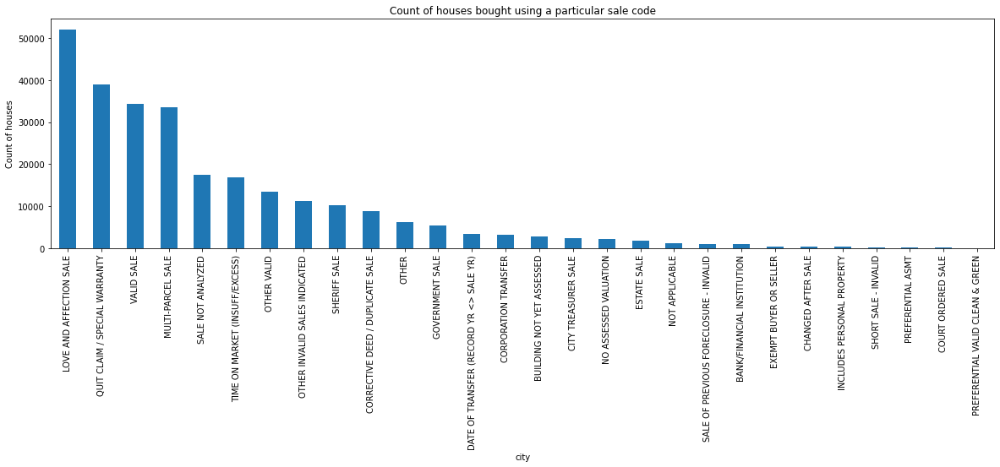

In [42]:
plt.figure(figsize=(20,5))

property_data['SALEDESC'].value_counts().plot(kind='bar')
plt.title('Count of houses bought using a particular sale code')
plt.xlabel('city')
plt.ylabel('Count of houses')
sns.despine


In [43]:
#handling outliers
final_sale = property_data['SALEDESC'].value_counts(ascending = True).rename_axis('sale')
print(final_sale.shape)
print(property_data.shape)
final_sale

final_sale = final_sale.iloc[9:]
print(final_sale)

(28,)
(269194, 11)
sale
NOT APPLICABLE                              1281
ESTATE SALE                                 1882
NO ASSESSED VALUATION                       2183
CITY TREASURER SALE                         2457
BUILDING NOT YET ASSESSED                   2837
CORPORATION TRANSFER                        3121
DATE OF TRANSFER (RECORD YR <> SALE YR)     3331
GOVERNMENT SALE                             5421
OTHER                                       6238
CORRECTIVE DEED / DUPLICATE SALE            8850
SHERIFF SALE                               10206
OTHER INVALID SALES INDICATED              11238
OTHER VALID                                13381
TIME ON MARKET (INSUFF/EXCESS)             16931
SALE NOT ANALYZED                          17494
MULTI-PARCEL SALE                          33465
VALID SALE                                 34380
QUIT CLAIM / SPECIAL WARRANTY              39021
LOVE AND AFFECTION SALE                    51936
Name: SALEDESC, dtype: int64


In [44]:
final_sale

sale
NOT APPLICABLE                              1281
ESTATE SALE                                 1882
NO ASSESSED VALUATION                       2183
CITY TREASURER SALE                         2457
BUILDING NOT YET ASSESSED                   2837
CORPORATION TRANSFER                        3121
DATE OF TRANSFER (RECORD YR <> SALE YR)     3331
GOVERNMENT SALE                             5421
OTHER                                       6238
CORRECTIVE DEED / DUPLICATE SALE            8850
SHERIFF SALE                               10206
OTHER INVALID SALES INDICATED              11238
OTHER VALID                                13381
TIME ON MARKET (INSUFF/EXCESS)             16931
SALE NOT ANALYZED                          17494
MULTI-PARCEL SALE                          33465
VALID SALE                                 34380
QUIT CLAIM / SPECIAL WARRANTY              39021
LOVE AND AFFECTION SALE                    51936
Name: SALEDESC, dtype: int64

In [45]:
property_data=property_data.merge(final_sale , left_on='SALEDESC', right_on='sale')
property_data=property_data.drop(columns=["SALEDESC_y"])
property_data=property_data.rename(columns={'SALEDESC_x': 'SALEDESC'})

In [46]:
property_data.shape

(265653, 11)

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

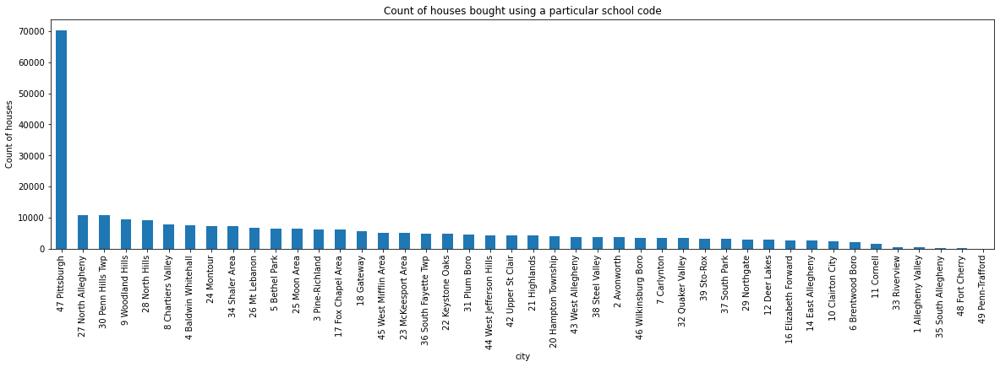

In [47]:


plt.figure(figsize=(20,5))

property_data['SCHOOLDESC'].value_counts().plot(kind='bar')
plt.title('Count of houses bought using a particular school code')
plt.xlabel('city')
plt.ylabel('Count of houses')
sns.despine

In [48]:
#handling outliers
final_school = property_data['SCHOOLDESC'].value_counts(ascending = True).rename_axis('sale')
print(final_school.shape)
print(property_data.shape)
final_school

final_school = final_school.iloc[5:]
print(final_school)
final_school.shape

(44,)
(265653, 11)
sale
11 Cornell                  1513
6 Brentwood Boro            2199
10 Clairton City            2342
14 East Allegheny           2557
16 Elizabeth Forward        2687
12 Deer Lakes               2888
29 Northgate                2990
37 South Park               3080
39 Sto-Rox                  3234
32 Quaker Valley            3534
7 Carlynton                 3550
46 Wilkinsburg Boro         3575
2 Avonworth                 3710
38 Steel Valley             3751
43 West Allegheny           3766
20 Hampton Township         3951
21 Highlands                4248
42 Upper St Clair           4324
44 West Jefferson Hills     4349
31 Plum Boro                4529
22 Keystone Oaks            4776
36 South Fayette Twp        4851
23 McKeesport Area          5043
45 West Mifflin Area        5134
18 Gateway                  5495
17 Fox Chapel Area          6147
3 Pine-Richland             6243
25 Moon Area                6452
5 Bethel Park               6534
26 Mt Lebanon      

(39,)

In [49]:
final_sale

sale
NOT APPLICABLE                              1281
ESTATE SALE                                 1882
NO ASSESSED VALUATION                       2183
CITY TREASURER SALE                         2457
BUILDING NOT YET ASSESSED                   2837
CORPORATION TRANSFER                        3121
DATE OF TRANSFER (RECORD YR <> SALE YR)     3331
GOVERNMENT SALE                             5421
OTHER                                       6238
CORRECTIVE DEED / DUPLICATE SALE            8850
SHERIFF SALE                               10206
OTHER INVALID SALES INDICATED              11238
OTHER VALID                                13381
TIME ON MARKET (INSUFF/EXCESS)             16931
SALE NOT ANALYZED                          17494
MULTI-PARCEL SALE                          33465
VALID SALE                                 34380
QUIT CLAIM / SPECIAL WARRANTY              39021
LOVE AND AFFECTION SALE                    51936
Name: SALEDESC, dtype: int64

In [50]:
property_data=property_data.merge(final_school , left_on='SCHOOLDESC', right_on='sale')
property_data=property_data.drop(columns=["SCHOOLDESC_y"])
property_data=property_data.rename(columns={'SCHOOLDESC_x': 'SCHOOLDESC'})

In [51]:
property_data.shape

(264364, 11)

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

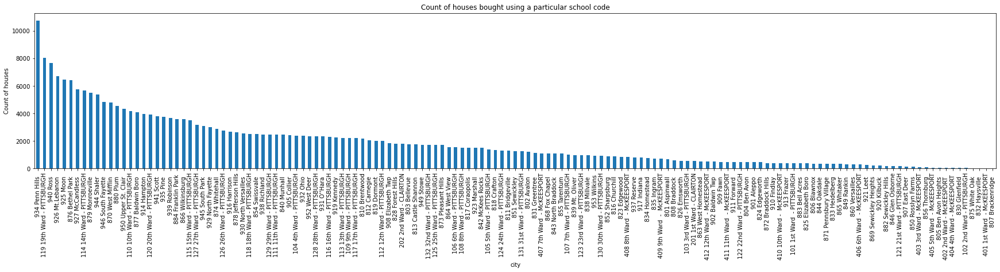

In [52]:
plt.figure(figsize=(30,5))

property_data['MUNIDESC'].value_counts().plot(kind='bar')
plt.title('Count of houses bought using a particular school code')
plt.xlabel('city')
plt.ylabel('Count of houses')
sns.despine

In [53]:
#handling outliers
final_mun = property_data['MUNIDESC'].value_counts(ascending = True).rename_axis('municipal code')
print(final_mun.shape)
print(property_data.shape)
# final_mun.head(85)

final_mun = final_mun.iloc[64:]
print(final_mun)
# final_mun

(145,)
(264364, 11)
municipal code
107 7th Ward - PITTSBURGH      1006
855 Tarentum                   1083
843 North Braddock             1096
868 Fox Chapel                 1098
407 7th Ward  - McKEESPORT     1111
                              ...  
925 Moon                       6452
926 Mt.Lebanon                 6713
940 Ross                       7652
119 19th Ward - PITTSBURGH     8017
934 Penn Hills                10756
Name: MUNIDESC, Length: 81, dtype: int64


In [54]:


property_data=property_data.merge(final_mun , left_on='MUNIDESC', right_on='municipal code')
property_data=property_data.drop(columns=["MUNIDESC_y"])
property_data=property_data.rename(columns={'MUNIDESC_x': 'MUNIDESC'})

In [55]:
property_data.shape

(236765, 11)

In [56]:
property_data=property_data.drop(columns=["PARID"])

In [57]:
property_timeseries = property_data.copy()
property_timeseries.shape

(236765, 10)

#### converting saledate to date format and making them into seperate columns

In [58]:
property_data['SALEDATE'] =  pd.to_datetime(property_data['SALEDATE'], format='%Y-%m-%d')

In [59]:
# convert date into month & year variables
property_data['saledate_day'] = property_data['SALEDATE'].apply(lambda x: x.day)
property_data['saledate_month'] = property_data['SALEDATE'].apply(lambda x: x.month)
property_data['saledate_year'] = property_data['SALEDATE'].apply(lambda x: x.year)

In [60]:
property_data=property_data.drop(columns=["SALEDATE"])

In [61]:
property_data

,PROPERTYHOUSENUM,PROPERTYADDRESSSTREET,PROPERTYCITY,PROPERTYZIP,SCHOOLDESC,MUNIDESC,PRICE,SALECODE,SALEDESC,saledate_day,saledate_month,saledate_year
0,4720.0,HIGHPOINT,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,120000.0,3,LOVE AND AFFECTION SALE,27,9,2012
1,4925.0,OAKHURST,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,74470.0,3,LOVE AND AFFECTION SALE,25,1,2012
2,5055.0,FOUNTAINWOOD,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,1.0,3,LOVE AND AFFECTION SALE,3,2,2012
3,5142.0,VIRGINIA,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,1.0,3,LOVE AND AFFECTION SALE,13,2,2012
4,2430.0,LAKEMONT,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,0.0,3,LOVE AND AFFECTION SALE,8,2,2012
...,...,...,...,...,...,...,...,...,...,...,...,...
236760,925.0,PEAIRS,ELIZABETH,15037.0,16 Elizabeth Forward,908 Elizabeth Twp,0.0,GV,GOVERNMENT SALE,31,5,2018
236761,105.0,VALLEYVUE,ELIZABETH,15037.0,16 Elizabeth Forward,908 Elizabeth Twp,0.0,GV,GOVERNMENT SALE,31,5,2018
236762,303.0,LONG,ELIZABETH,15037.0,16 Elizabeth Forward,908 Elizabeth Twp,32000.0,GV,GOVERNMENT SALE,20,7,2018
236763,925.0,PEAIRS,ELIZABETH,15037.0,16 Elizabeth Forward,908 Elizabeth Twp,5200.0,GV,GOVERNMENT SALE,26,10,2018


## Normalizing numerical data

In [62]:
def encode_numeric_zscore(df, name, mean=None, sd=None):
    if mean is None:
        mean = df[name].mean()

    if sd is None:
        sd = df[name].std()

    df[name] = (df[name] - mean) / sd

encode_numeric_zscore(property_data,'saledate_day')
encode_numeric_zscore(property_data,'saledate_month')
encode_numeric_zscore(property_data,'saledate_year')

In [63]:
#drop rows which have null values in the "PRICE" feature
property_data = property_data[property_data['PRICE'].notna()]

In [64]:
print("No of rows with the Price value = '0'")
print(len(property_data[property_data['PRICE'] == 0]))
print("No of rows with the Price value = '1'")
print(len(property_data[property_data['PRICE'] == 1]))


No of rows with the Price value = '0'
7894
No of rows with the Price value = '1'
45257


In [65]:
property_data.shape

(235278, 12)

In [66]:
#Replace the 0 and 1 values with NaN
property_data['PRICE'] = property_data['PRICE'].replace([0], np.NAN)

<ipython-input-66-683cf2556815>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  property_data['PRICE'] = property_data['PRICE'].replace([0], np.NAN)


In [67]:
property_data['PRICE'] = property_data['PRICE'].replace([1], np.NAN)

<ipython-input-67-1b3fd9304c0f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  property_data['PRICE'] = property_data['PRICE'].replace([1], np.NAN)


In [68]:
print(property_data.isnull().sum(axis = 0))

PROPERTYHOUSENUM            14
PROPERTYADDRESSSTREET        3
PROPERTYCITY                 0
PROPERTYZIP                  0
SCHOOLDESC                   0
MUNIDESC                     0
PRICE                    53151
SALECODE                     0
SALEDESC                     0
saledate_day                 0
saledate_month               0
saledate_year                0
dtype: int64


In [69]:
prop = property_data[['PROPERTYZIP', 'PRICE']]

In [70]:
property_data.shape

(235278, 12)

In [71]:
prop.shape

(235278, 2)

In [72]:
prop.head(10)

,PROPERTYZIP,PRICE
0,15044.0,120000.0
1,15044.0,74470.0
2,15044.0,NaN
3,15044.0,NaN
4,15044.0,NaN
5,15044.0,NaN
6,15044.0,289000.0
7,15044.0,NaN
8,15044.0,NaN
9,15044.0,NaN


In [73]:
print(prop.isnull().sum(axis = 0))

PROPERTYZIP        0
PRICE          53151
dtype: int64


In [74]:
prop = prop.dropna(axis=0, subset=['PROPERTYZIP'])

In [75]:
print(prop.isnull().sum(axis = 0))

PROPERTYZIP        0
PRICE          53151
dtype: int64


In [76]:
# import pyodbc

In [77]:
# conn = pyodbc.connect('Driver={ODBC Driver 17 for SQL Server};'
#                       'Server=UL-ARC1003-476\SQLEXPRESS;'
#                       'Database=FinalProject;'
#                       'Trusted_Connection=yes;')

# cursor = conn.cursor()
# cursor.execute('SELECT * FROM FinalProject.dbo.Persons')

# for row in cursor:
#     print(row)

In [78]:

# for index, row in prop.iterrows():
#     try:
#         cursor.execute("INSERT INTO FinalProject.dbo.Price_Zip(zipcode, price) values(?,?)", row.PROPERTYZIP, row.PRICE)
#         cursor.commit()
#     except:
#         value = None
#         cursor.execute("INSERT INTO FinalProject.dbo.Price_Zip(zipcode, price) values(?,?)", row.PROPERTYZIP, value)
#         cursor.commit()
        
        


# cursor.close()



In [79]:
prop.head(10)

,PROPERTYZIP,PRICE
0,15044.0,120000.0
1,15044.0,74470.0
2,15044.0,NaN
3,15044.0,NaN
4,15044.0,NaN
5,15044.0,NaN
6,15044.0,289000.0
7,15044.0,NaN
8,15044.0,NaN
9,15044.0,NaN


In [80]:
prop = prop.groupby('PROPERTYZIP').mean()

In [81]:
prop.shape

(58, 1)

In [ ]:
prop.head(10)

In [ ]:
print(prop.isnull().sum(axis = 0))

In [ ]:
prop.shape

In [ ]:
prop.head()

In [ ]:
prop


### Combining 2 dataframes based on PROPERTYZIP column in 1st dataframe and index in 2nd dataframe

In [ ]:
#pd.merge(property_data, prop, on='propertyzip')

property_data=property_data.merge(prop , left_on='PROPERTYZIP', right_index=True)

In [ ]:
property_data

### Replacing null values in PRICE_x column with the corresponding average value in PRICE_y

In [ ]:
property_data.PRICE_x.fillna(property_data.PRICE_y, inplace=True)

In [ ]:
property_data

### Dropping PRICE_y column

In [ ]:
property_data=property_data.drop(['PRICE_y'], axis = 1)

### Drop the rows with invalid salecodes

In [ ]:
invalidsalecodes=['1','32','2','GV','6','35','37','99','PA','UX', 'VB', 'VH', '0X', '50', 'PX', 'X', 'XX', 'YY', 'Z', '21', '24', '25',
'26', '28', '29', '4', '5', '7', '8', 'S', 'V', 'ND']
for code in invalidsalecodes:
    property_data.drop(property_data[property_data['SALECODE'] == code].index, inplace = True)

In [ ]:
property_data.shape

In [ ]:
property_data

In [ ]:
property_data.dtypes

### Renaming PRICE_x column name with PRICE for convenience

In [ ]:
property_data=property_data.rename(columns={'PRICE_x': 'PRICE'})

In [ ]:
def remove_outliers(df, name, sd):
    drop_rows = df.index[(np.abs(df[name] - df[name].mean()) >= (sd * df[name].std()))]
    df.drop(drop_rows, axis=0, inplace=True)


### concatenating salecode and saledesc and dropping salecode

In [ ]:
property_data['SALEDESC'] =  property_data["SALECODE"].astype(str) +" "+ property_data["SALEDESC"]

In [ ]:
property_data=property_data.drop(columns=["SALECODE"])

#### Dropping housenumbers as it now contributing to the price prediction

In [ ]:
property_data.shape

In [ ]:
property_data=property_data.drop(columns=["PROPERTYHOUSENUM"])

In [ ]:
property_data.shape

In [ ]:
property_data.columns

In [ ]:
property_data.dtypes

In [ ]:
property_data.PROPERTYADDRESSSTREET.value_counts()

In [ ]:
property_data.SALEDESC.value_counts()

In [ ]:
saledesccount=[]
for a in property_data.SALEDESC.unique():
    if property_data.SALEDESC.value_counts()[a]<9000:
        saledesccount.append(a)
    if a in saledesccount:
        print(a)
        #df.PROPERTYADDRESSSTREET=df.PROPERTYADDRESSSTREET.replace(a, 'other')
        property_data['SALEDESC'] = property_data['SALEDESC'].replace(a,'other')

In [ ]:
property_data.SCHOOLDESC.value_counts()

In [ ]:
schoolcount=[]
for a in property_data.SCHOOLDESC.unique():
    if property_data.SCHOOLDESC.value_counts()[a]<5000:
        schoolcount.append(a)
    if a in schoolcount:
        print(a)
        #df.PROPERTYADDRESSSTREET=df.PROPERTYADDRESSSTREET.replace(a, 'other')
        property_data['SCHOOLDESC'] = property_data['SCHOOLDESC'].replace(a,'other')

In [ ]:
property_data.MUNIDESC.value_counts()

In [ ]:
municount=[]
for a in property_data.MUNIDESC.unique():
    if property_data.MUNIDESC.value_counts()[a]<5000:
        municount.append(a)
    if a in municount:
        print(a)
        #df.PROPERTYADDRESSSTREET=df.PROPERTYADDRESSSTREET.replace(a, 'other')
        property_data['MUNIDESC'] = property_data['MUNIDESC'].replace(a,'other')

In [ ]:
property_data.PROPERTYADDRESSSTREET.value_counts()

In [ ]:
prop_test = property_data.copy()
prop_test = pd.DataFrame(np.random.rand(10, 5),columns=['PROPERTYZIP','PRICE', 'saledate_day', 'saledate_month','saledate_year'])
prop_test.plot(kind='box', figsize=(8,8))
plt.show()



#### As there are many street values, Replacing the street names whose count are less than 50 with other, there by reducing number of columns during one-hot encoding

In [ ]:
streetcountLt50=[]
for a in property_data.PROPERTYADDRESSSTREET.unique():
    if property_data.PROPERTYADDRESSSTREET.value_counts()[a]<50:
        streetcountLt50.append(a)
    if a in streetcountLt50:
        print(a)
        #df.PROPERTYADDRESSSTREET=df.PROPERTYADDRESSSTREET.replace(a, 'other')
        property_data['PROPERTYADDRESSSTREET'] = property_data['PROPERTYADDRESSSTREET'].replace(a,'other')

In [ ]:
property_data.PROPERTYADDRESSSTREET.value_counts().head(31)

## one-hot encode object features

In [ ]:
def encode_text_dummy(df, name):
    dummies = pd.get_dummies(df[name])
    for x in dummies.columns:
        dummy_name = "{}-{}".format(name, x)
        df[dummy_name] = dummies[x]
    df.drop(name, axis=1, inplace=True)

encode_text_dummy(property_data,'PROPERTYADDRESSSTREET')
encode_text_dummy(property_data,'PROPERTYZIP')
encode_text_dummy(property_data,'SCHOOLDESC')
encode_text_dummy(property_data,'MUNIDESC')
encode_text_dummy(property_data,'PROPERTYCITY')
encode_text_dummy(property_data,'SALEDESC')

In [ ]:
property_data.head()

In [ ]:
prop_fit = property_data.copy()

In [ ]:
prop_fit.shape

## Split the data

In [ ]:
y = prop_fit['PRICE']
X = prop_fit.drop(columns=['PRICE'])

In [ ]:
#select k best harini
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)

In [ ]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

In [ ]:
#Train the model
from sklearn import linear_model
model = linear_model.LinearRegression()

In [ ]:
model.fit(X_train, y_train)

In [ ]:
lr_pred_all = model.predict(X_test)

In [ ]:
lr_mse  = mean_squared_error(lr_pred_all, y_test)
lr_rmse = np.sqrt(lr_mse)
print('MSE Score for Linear Regression:')
print(lr_mse)
print('RMSE Score for Linear Regression:')
print(lr_rmse)

oos_y = pd.DataFrame(y_test.values, columns=['ground_truth'])
oos_pred = pd.DataFrame(lr_pred_all, columns=['predicted'])
oosDF = pd.concat([oos_y, oos_pred],axis=1)
# oosDF = pd.DataFrame(y_test - lr_pred)

oosDF[200:230]
# oosDF.shape

In [ ]:
# feature selection

from sklearn.feature_selection import SelectKBest, chi2
from sklearn.feature_selection import f_regression

# feature selection
def select_features(X_train, y_train, X_test):
    # configure to select all features
    fs = SelectKBest(score_func=f_regression, k=20)
    # learn relationship from training data
    fs.fit(X_train, y_train)
    # transform train input data
    X_train_fs = fs.transform(X_train)
    # transform test input data
    X_test_fs = fs.transform(X_test)
    return X_train_fs, X_test_fs, fs

In [ ]:
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
# for i in range(len(fs.scores_)):
# 	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
plt.bar([i for i in range(len(fs.scores_))], fs.scores_)
plt.show()


In [ ]:
# fit the model
lreg = LinearRegression()
lreg.fit(X_train_fs, y_train)
# evaluate the model
lreg_pred = lreg.predict(X_test_fs)

## Feature Importance

In [ ]:

lr_mse  = mean_squared_error(lreg_pred, y_test)
lr_rmse = np.sqrt(lr_mse)
print('MSE Score for Linear Regression:')
print(lr_mse)
print('RMSE Score for Linear Regression:')
print(lr_rmse)

In [ ]:
# print(X_reg_new)

In [ ]:
oos_y = pd.DataFrame(y_test.values, columns=['ground_truth'])
oos_pred = pd.DataFrame(lreg_pred, columns=['predicted'])
oosDF = pd.concat([oos_y, oos_pred],axis=1)
# oosDF = pd.DataFrame(y_test - lr_pred)

oosDF[200:230]
# oosDF.shape

## Time series

In [82]:
property_timeseries.head()

,PROPERTYHOUSENUM,PROPERTYADDRESSSTREET,PROPERTYCITY,PROPERTYZIP,SCHOOLDESC,MUNIDESC,SALEDATE,PRICE,SALECODE,SALEDESC
0,4720.0,HIGHPOINT,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-09-27,120000.0,3,LOVE AND AFFECTION SALE
1,4925.0,OAKHURST,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-01-25,74470.0,3,LOVE AND AFFECTION SALE
2,5055.0,FOUNTAINWOOD,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-02-03,1.0,3,LOVE AND AFFECTION SALE
3,5142.0,VIRGINIA,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-02-13,1.0,3,LOVE AND AFFECTION SALE
4,2430.0,LAKEMONT,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-02-08,0.0,3,LOVE AND AFFECTION SALE


In [83]:
# len(proprty_timeseries["SALEDATE"].unique())
property_timeseries.shape

(236765, 10)

In [84]:
property_timeseries.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 236765 entries, 0 to 236764
Data columns (total 10 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   PROPERTYHOUSENUM       236751 non-null  float64
 1   PROPERTYADDRESSSTREET  236762 non-null  object 
 2   PROPERTYCITY           236765 non-null  object 
 3   PROPERTYZIP            236765 non-null  float64
 4   SCHOOLDESC             236765 non-null  object 
 5   MUNIDESC               236765 non-null  object 
 6   SALEDATE               236765 non-null  object 
 7   PRICE                  235278 non-null  float64
 8   SALECODE               236765 non-null  object 
 9   SALEDESC               236765 non-null  object 
dtypes: float64(3), object(7)
memory usage: 19.9+ MB


In [85]:
# property_timeseries.drop(columns = ['PROPERTYHOUSENUM'])

In [86]:
property_timeseries = property_timeseries[property_timeseries['PRICE'].notna()]

In [87]:
print("No of rows with the Price value = '0'")
print(len(property_timeseries[property_timeseries['PRICE'] == 0]))
print("No of rows with the Price value = '1'")
print(len(property_timeseries[property_timeseries['PRICE'] == 1]))


No of rows with the Price value = '0'
7894
No of rows with the Price value = '1'
45257


In [88]:
property_timeseries.shape

(235278, 10)

In [89]:
#Replace the 0 and 1 values with NaN
property_timeseries['PRICE'] = property_timeseries['PRICE'].replace([0], np.NAN)
property_timeseries['PRICE'] = property_timeseries['PRICE'].replace([1], np.NAN)

In [90]:
print(property_timeseries.isnull().sum(axis = 0))

PROPERTYHOUSENUM            14
PROPERTYADDRESSSTREET        3
PROPERTYCITY                 0
PROPERTYZIP                  0
SCHOOLDESC                   0
MUNIDESC                     0
SALEDATE                     0
PRICE                    53151
SALECODE                     0
SALEDESC                     0
dtype: int64


In [91]:
prop_time = property_timeseries[['PROPERTYZIP', 'PRICE']]

In [92]:
prop_time.head(10)

,PROPERTYZIP,PRICE
0,15044.0,120000.0
1,15044.0,74470.0
2,15044.0,NaN
3,15044.0,NaN
4,15044.0,NaN
5,15044.0,NaN
6,15044.0,289000.0
7,15044.0,NaN
8,15044.0,NaN
9,15044.0,NaN


In [93]:
print(prop_time.isnull().sum(axis = 0))

PROPERTYZIP        0
PRICE          53151
dtype: int64


In [94]:
prop_time = prop_time.dropna(axis=0, subset=['PROPERTYZIP'])

In [95]:
print(prop_time.isnull().sum(axis = 0))

PROPERTYZIP        0
PRICE          53151
dtype: int64


In [96]:
prop_time = prop_time.groupby('PROPERTYZIP').mean()

In [97]:
prop_time.head()

,PRICE
PROPERTYZIP,
15017.0,381570.658366
15025.0,175423.446965
15037.0,107199.577223
15044.0,312533.230402
15057.0,253308.893720


In [98]:
print(prop_time.isnull().sum(axis = 0))

PRICE    0
dtype: int64


In [99]:
print(prop_time.shape)
prop_time.head()

(58, 1)


,PRICE
PROPERTYZIP,
15017.0,381570.658366
15025.0,175423.446965
15037.0,107199.577223
15044.0,312533.230402
15057.0,253308.893720


In [100]:
property_timeseries = property_timeseries.merge(prop_time, left_on='PROPERTYZIP', right_index=True)

In [101]:
property_timeseries

,PROPERTYHOUSENUM,PROPERTYADDRESSSTREET,PROPERTYCITY,PROPERTYZIP,SCHOOLDESC,MUNIDESC,SALEDATE,PRICE_x,SALECODE,SALEDESC,PRICE_y
0,4720.0,HIGHPOINT,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-09-27,120000.0,3,LOVE AND AFFECTION SALE,312533.230402
1,4925.0,OAKHURST,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-01-25,74470.0,3,LOVE AND AFFECTION SALE,312533.230402
2,5055.0,FOUNTAINWOOD,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-02-03,NaN,3,LOVE AND AFFECTION SALE,312533.230402
3,5142.0,VIRGINIA,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-02-13,NaN,3,LOVE AND AFFECTION SALE,312533.230402
4,2430.0,LAKEMONT,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-02-08,NaN,3,LOVE AND AFFECTION SALE,312533.230402
...,...,...,...,...,...,...,...,...,...,...,...
236760,925.0,PEAIRS,ELIZABETH,15037.0,16 Elizabeth Forward,908 Elizabeth Twp,2018-05-31,NaN,GV,GOVERNMENT SALE,107199.577223
236761,105.0,VALLEYVUE,ELIZABETH,15037.0,16 Elizabeth Forward,908 Elizabeth Twp,2018-05-31,NaN,GV,GOVERNMENT SALE,107199.577223
236762,303.0,LONG,ELIZABETH,15037.0,16 Elizabeth Forward,908 Elizabeth Twp,2018-07-20,32000.0,GV,GOVERNMENT SALE,107199.577223
236763,925.0,PEAIRS,ELIZABETH,15037.0,16 Elizabeth Forward,908 Elizabeth Twp,2018-10-26,5200.0,GV,GOVERNMENT SALE,107199.577223


In [102]:
print(property_timeseries.isnull().sum(axis = 0))

PROPERTYHOUSENUM            14
PROPERTYADDRESSSTREET        3
PROPERTYCITY                 0
PROPERTYZIP                  0
SCHOOLDESC                   0
MUNIDESC                     0
SALEDATE                     0
PRICE_x                  53151
SALECODE                     0
SALEDESC                     0
PRICE_y                      0
dtype: int64


In [103]:
property_timeseries.PRICE_x.fillna(property_timeseries.PRICE_y, inplace=True)

In [104]:
property_timeseries = property_timeseries.drop(['PRICE_y'], axis = 1)

In [105]:
invalidsalecodes_t=['1','32','2','GV','6','35','37','99','PA','UX', 'VB', 'VH', '0X', '50', 'PX', 'X', 'XX', 'YY', 'Z', '21', '24', '25',
'26', '28', '29', '4', '5', '7', '8', 'S', 'V', 'ND']
for code in invalidsalecodes_t:
    property_timeseries.drop(property_timeseries[property_timeseries['SALECODE'] == code].index, inplace = True)

In [106]:
property_timeseries.shape

(201179, 10)

In [107]:
property_timeseries.dtypes

PROPERTYHOUSENUM         float64
PROPERTYADDRESSSTREET     object
PROPERTYCITY              object
PROPERTYZIP              float64
SCHOOLDESC                object
MUNIDESC                  object
SALEDATE                  object
PRICE_x                  float64
SALECODE                  object
SALEDESC                  object
dtype: object

In [108]:
property_timeseries = property_timeseries.rename(columns={'PRICE_x': 'PRICE'})

In [109]:
property_timeseries.head(10)

,PROPERTYHOUSENUM,PROPERTYADDRESSSTREET,PROPERTYCITY,PROPERTYZIP,SCHOOLDESC,MUNIDESC,SALEDATE,PRICE,SALECODE,SALEDESC
0,4720.0,HIGHPOINT,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-09-27,120000.000000,3,LOVE AND AFFECTION SALE
1,4925.0,OAKHURST,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-01-25,74470.000000,3,LOVE AND AFFECTION SALE
2,5055.0,FOUNTAINWOOD,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-02-03,312533.230402,3,LOVE AND AFFECTION SALE
3,5142.0,VIRGINIA,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-02-13,312533.230402,3,LOVE AND AFFECTION SALE
4,2430.0,LAKEMONT,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-02-08,312533.230402,3,LOVE AND AFFECTION SALE
5,4830.0,ANDREWS,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-03-01,312533.230402,3,LOVE AND AFFECTION SALE
6,4919.0,CANYON CREEK,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-03-13,289000.000000,3,LOVE AND AFFECTION SALE
7,3605.0,STAG,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-04-05,312533.230402,3,LOVE AND AFFECTION SALE
8,3317.0,CRAMLINGTON,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-05-29,312533.230402,3,LOVE AND AFFECTION SALE
9,2990.0,CHAUTAUQUA,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-06-13,312533.230402,3,LOVE AND AFFECTION SALE


In [110]:
print(property_timeseries.isnull().sum(axis = 0))

PROPERTYHOUSENUM         8
PROPERTYADDRESSSTREET    2
PROPERTYCITY             0
PROPERTYZIP              0
SCHOOLDESC               0
MUNIDESC                 0
SALEDATE                 0
PRICE                    0
SALECODE                 0
SALEDESC                 0
dtype: int64


In [111]:
# property_data = property_data.drop(columns = ["PROPERTYADDRESSDIR","PROPERTYADDRESSUNITDESC","PROPERTYUNITNO"])
property_timeseries = property_timeseries.drop(columns = ['PROPERTYHOUSENUM'],axis=1)
print(property_timeseries.shape)

(201179, 9)


In [112]:
property_timeseries.columns

Index(['PROPERTYADDRESSSTREET', 'PROPERTYCITY', 'PROPERTYZIP', 'SCHOOLDESC',
       'MUNIDESC', 'SALEDATE', 'PRICE', 'SALECODE', 'SALEDESC'],
      dtype='object')

In [113]:
print(property_timeseries.isnull().sum(axis = 0))

PROPERTYADDRESSSTREET    2
PROPERTYCITY             0
PROPERTYZIP              0
SCHOOLDESC               0
MUNIDESC                 0
SALEDATE                 0
PRICE                    0
SALECODE                 0
SALEDESC                 0
dtype: int64


In [114]:
property_timeseries = property_timeseries.dropna()

In [115]:
property_timeseries.isnull().any().any()

False

In [116]:
property_timeseries.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 201177 entries, 0 to 236728
Data columns (total 9 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   PROPERTYADDRESSSTREET  201177 non-null  object 
 1   PROPERTYCITY           201177 non-null  object 
 2   PROPERTYZIP            201177 non-null  float64
 3   SCHOOLDESC             201177 non-null  object 
 4   MUNIDESC               201177 non-null  object 
 5   SALEDATE               201177 non-null  object 
 6   PRICE                  201177 non-null  float64
 7   SALECODE               201177 non-null  object 
 8   SALEDESC               201177 non-null  object 
dtypes: float64(2), object(7)
memory usage: 15.3+ MB


In [117]:
property_timeseries.describe()

,PROPERTYZIP,PRICE
count,201177.000000,2.011770e+05
mean,15170.721921,2.245701e+05
std,66.371433,6.903958e+05
min,15017.000000,2.000000e+00
25%,15108.000000,9.500000e+04
50%,15206.000000,1.600000e+05
75%,15226.000000,2.515699e+05
max,15243.000000,1.120000e+08


### Time series visualisation

#### SALEDATE

In [118]:
property_timeseries.head()

,PROPERTYADDRESSSTREET,PROPERTYCITY,PROPERTYZIP,SCHOOLDESC,MUNIDESC,SALEDATE,PRICE,SALECODE,SALEDESC
0,HIGHPOINT,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-09-27,120000.000000,3,LOVE AND AFFECTION SALE
1,OAKHURST,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-01-25,74470.000000,3,LOVE AND AFFECTION SALE
2,FOUNTAINWOOD,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-02-03,312533.230402,3,LOVE AND AFFECTION SALE
3,VIRGINIA,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-02-13,312533.230402,3,LOVE AND AFFECTION SALE
4,LAKEMONT,GIBSONIA,15044.0,20 Hampton Township,914 Hampton,2012-02-08,312533.230402,3,LOVE AND AFFECTION SALE


In [119]:
property_timeseries['SALEDATE'] =  pd.to_datetime(property_timeseries['SALEDATE'], format='%Y-%m-%d')
property_timeseries['saledate_month'] = property_timeseries['SALEDATE'].apply(lambda x: x.month)


In [120]:
property_timeseries.dtypes

PROPERTYADDRESSSTREET            object
PROPERTYCITY                     object
PROPERTYZIP                     float64
SCHOOLDESC                       object
MUNIDESC                         object
SALEDATE                 datetime64[ns]
PRICE                           float64
SALECODE                         object
SALEDESC                         object
saledate_month                    int64
dtype: object

In [121]:
print("This Data contains properties sold from {} to {}".format(property_timeseries.SALEDATE.min(), property_timeseries.SALEDATE.max()))

This Data contains properties sold from 2012-01-01 00:00:00 to 2020-10-28 00:00:00


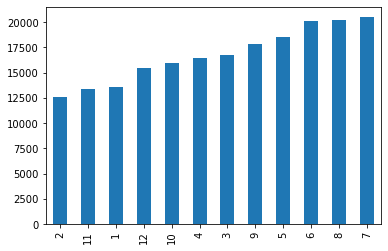

In [122]:
# Monthly sale of properties 
pd.to_datetime(property_timeseries.SALEDATE).dt.month.value_counts(ascending = True).plot(kind = 'bar')

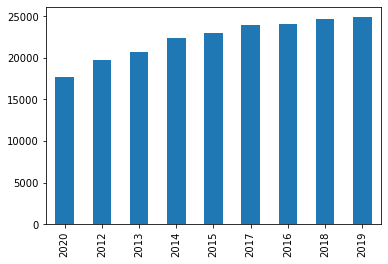

In [123]:
# Yearly sale of properties
pd.to_datetime(property_timeseries.SALEDATE).dt.year.value_counts(ascending = True).plot(kind = 'bar')

#### SCHOOLDESC

In [124]:
school_list = property_timeseries.SCHOOLDESC.unique().tolist()


In [125]:
print(school_list)

['20 Hampton Township', '3 Pine-Richland', '12 Deer Lakes', '27 North Allegheny', '28 North Hills', '34 Shaler Area', '17 Fox Chapel Area', '21 Highlands', '2 Avonworth', '32 Quaker Valley', '47 Pittsburgh', '22 Keystone Oaks', '26 Mt Lebanon', '8 Chartiers Valley', '4 Baldwin Whitehall', '30 Penn Hills Twp', '9 Woodland Hills', '46 Wilkinsburg Boro', '45 West Mifflin Area', '31 Plum Boro', '5 Bethel Park', '6 Brentwood Boro', '24 Montour', '7 Carlynton', '25 Moon Area', '38 Steel Valley', '44 West Jefferson Hills', '37 South Park', '29 Northgate', '42 Upper St Clair', '10 Clairton City', '36 South Fayette Twp', '43 West Allegheny', '14 East Allegheny', '18 Gateway', '11 Cornell', '39 Sto-Rox', '23 McKeesport Area', '16 Elizabeth Forward']


(-1.1096422454298693, 1.100785292696872, -1.100581834258731, 1.100154007568708)

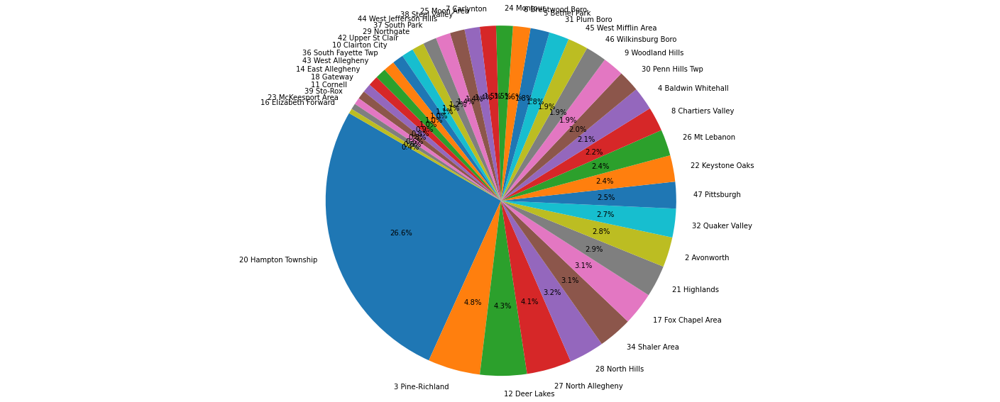

In [126]:
plt.figure(figsize=(25,10))
plt.pie(property_timeseries['SCHOOLDESC'].value_counts(), labels = school_list, autopct='%1.1f%%', startangle = 150)
plt.axis('equal')

In [127]:
property_timeseries.columns

Index(['PROPERTYADDRESSSTREET', 'PROPERTYCITY', 'PROPERTYZIP', 'SCHOOLDESC',
       'MUNIDESC', 'SALEDATE', 'PRICE', 'SALECODE', 'SALEDESC',
       'saledate_month'],
      dtype='object')

In [128]:
property_timeseries = property_timeseries.drop(columns = 'SALEDATE')

In [129]:
property_timeseries.dtypes

PROPERTYADDRESSSTREET     object
PROPERTYCITY              object
PROPERTYZIP              float64
SCHOOLDESC                object
MUNIDESC                  object
PRICE                    float64
SALECODE                  object
SALEDESC                  object
saledate_month             int64
dtype: object

In [130]:
# We bin the postcode for easier analysis
bins = pd.IntervalIndex.from_tuples([(6,8), (9,12), (3,5),(1,2)])
property_timeseries['saledate_month'] = pd.cut(property_timeseries['saledate_month'],bins)

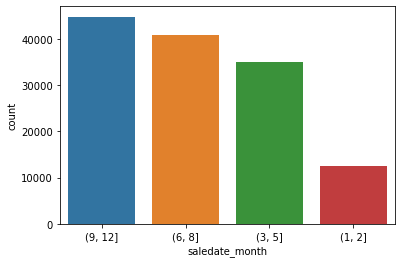

In [131]:
# Summer = (6,8)
# Fall = (9,12)
# Winter = (1,2)
# Spring = (3,5)
sns.countplot(property_timeseries["saledate_month"], order = property_timeseries["saledate_month"].value_counts().index)

In [132]:
property_timeseries['saledate_month'].head(20)

0             NaN
1             NaN
2      (1.0, 2.0]
3      (1.0, 2.0]
4      (1.0, 2.0]
5             NaN
6             NaN
7      (3.0, 5.0]
8      (3.0, 5.0]
9             NaN
10            NaN
11     (6.0, 8.0]
12            NaN
13    (9.0, 12.0]
14    (9.0, 12.0]
15    (9.0, 12.0]
16    (9.0, 12.0]
17    (9.0, 12.0]
18    (9.0, 12.0]
19    (9.0, 12.0]
Name: saledate_month, dtype: category
Categories (4, interval[int64]): [(6, 8] < (9, 12] < (3, 5] < (1, 2]]

In [133]:
property_timeseries.dtypes

PROPERTYADDRESSSTREET      object
PROPERTYCITY               object
PROPERTYZIP               float64
SCHOOLDESC                 object
MUNIDESC                   object
PRICE                     float64
SALECODE                   object
SALEDESC                   object
saledate_month           category
dtype: object

In [134]:
y = property_timeseries.PRICE

In [135]:
#Normalization
# Encode a numeric column as zscores
def encode_numeric_zscore(df, name, mean=None, sd=None):
    if mean is None:
        mean = df[name].mean()

    if sd is None:
        sd = df[name].std()

    df[name] = (df[name] - mean) / sd

    
    
    
encode_numeric_zscore(property_timeseries,'PROPERTYZIP')
encode_numeric_zscore(property_timeseries,'PRICE')

In [136]:
property_timeseries.head()

,PROPERTYADDRESSSTREET,PROPERTYCITY,PROPERTYZIP,SCHOOLDESC,MUNIDESC,PRICE,SALECODE,SALEDESC,saledate_month
0,HIGHPOINT,GIBSONIA,-1.909284,20 Hampton Township,914 Hampton,-0.151464,3,LOVE AND AFFECTION SALE,NaN
1,OAKHURST,GIBSONIA,-1.909284,20 Hampton Township,914 Hampton,-0.217412,3,LOVE AND AFFECTION SALE,NaN
2,FOUNTAINWOOD,GIBSONIA,-1.909284,20 Hampton Township,914 Hampton,0.127410,3,LOVE AND AFFECTION SALE,"(1.0, 2.0]"
3,VIRGINIA,GIBSONIA,-1.909284,20 Hampton Township,914 Hampton,0.127410,3,LOVE AND AFFECTION SALE,"(1.0, 2.0]"
4,LAKEMONT,GIBSONIA,-1.909284,20 Hampton Township,914 Hampton,0.127410,3,LOVE AND AFFECTION SALE,"(1.0, 2.0]"


In [137]:
# Convert a Pandas dataframe to the x,y inputs that TensorFlow needs
def to_xy(df, target):
    result = []
    for x in df.columns:
        if x != target:
            result.append(x)
    # find out the type of the target column. 
    target_type = df[target].dtypes
    target_type = target_type[0] if isinstance(target_type, Sequence) else target_type
    # Encode to int for classification, float otherwise. TensorFlow likes 32 bits.
    if target_type in (np.int64, np.int32):
        # Classification
        dummies = pd.get_dummies(df[target])
        return df[result].values.astype(np.float32), dummies.values.astype(np.float32)
    else:
        # Regression
        return df[result].values.astype(np.float32), df[target].values.astype(np.float32)

    

In [138]:
saledesccount=[]
for a in property_timeseries.SALEDESC.unique():
    if property_timeseries.SALEDESC.value_counts()[a]<9000:
        saledesccount.append(a)
    if a in saledesccount:
        print(a)
        #df.PROPERTYADDRESSSTREET=df.PROPERTYADDRESSSTREET.replace(a, 'other')
        property_timeseries['SALEDESC'] = property_timeseries['SALEDESC'].replace(a,'other')



NOT APPLICABLE
BUILDING NOT YET ASSESSED
DATE OF TRANSFER (RECORD YR <> SALE YR)
NO ASSESSED VALUATION


In [139]:
schoolcount=[]
for a in property_timeseries.SCHOOLDESC.unique():
    if property_timeseries.SCHOOLDESC.value_counts()[a]<5000:
        schoolcount.append(a)
    if a in schoolcount:
        print(a)
        #df.PROPERTYADDRESSSTREET=df.PROPERTYADDRESSSTREET.replace(a, 'other')
        property_timeseries['SCHOOLDESC'] = property_timeseries['SCHOOLDESC'].replace(a,'other')



20 Hampton Township
12 Deer Lakes
34 Shaler Area
17 Fox Chapel Area
21 Highlands
2 Avonworth
32 Quaker Valley
22 Keystone Oaks
9 Woodland Hills
46 Wilkinsburg Boro
45 West Mifflin Area
31 Plum Boro
6 Brentwood Boro
24 Montour
7 Carlynton
38 Steel Valley
44 West Jefferson Hills
37 South Park
29 Northgate
42 Upper St Clair
10 Clairton City
36 South Fayette Twp
43 West Allegheny
14 East Allegheny
18 Gateway
11 Cornell
39 Sto-Rox
23 McKeesport Area
16 Elizabeth Forward


In [140]:
municount=[]
for a in property_timeseries.MUNIDESC.unique():
    if property_timeseries.MUNIDESC.value_counts()[a]<5000:
        municount.append(a)
    if a in municount:
        print(a)
        #df.PROPERTYADDRESSSTREET=df.PROPERTYADDRESSSTREET.replace(a, 'other')
        property_timeseries['MUNIDESC'] = property_timeseries['MUNIDESC'].replace(a,'other')

914 Hampton  
938 Richland  
935 Pine  
952 West Deer  
944 Shaler  
931 O''Hara  
868 Fox Chapel  
884 Franklin Park 
923 Marshall  
855 Tarentum  
932 Ohio  
864 West View  
851 Sewickley  
105 5th Ward - PITTSBURGH
106 6th Ward - PITTSBURGH
104 4th Ward - PITTSBURGH
117 17th Ward - PITTSBURGH
107 7th Ward - PITTSBURGH
108 8th Ward - PITTSBURGH
120 20th Ward - PITTSBURGH
819 Dormont  
941 Scott  
132 32nd Ward - PITTSBURGH
118 18th Ward - PITTSBURGH
127 27th Ward - PITTSBURGH
124 24th Ward - PITTSBURGH
125 25th Ward - PITTSBURGH
126 26th Ward - PITTSBURGH
129 29th Ward - PITTSBURGH
116 16th Ward - PITTSBURGH
877 Baldwin Boro  
109 9th Ward - PITTSBURGH
110 10th Ward - PITTSBURGH
113 13th Ward - PITTSBURGH
112 12th Ward - PITTSBURGH
111 11th Ward - PITTSBURGH
828 Forest Hills  
854 Swissvale  
866 Wilkinsburg  
115 15th Ward - PITTSBURGH
131 31st Ward - PITTSBURGH
870 West Mifflin  
880 Plum  
813 Castle Shannon  
874 Whitehall  
810 Brentwood
128 28th Ward - PITTSBURGH
831 Greentree 

In [141]:
streetcountLt50=[]
for a in property_timeseries.PROPERTYADDRESSSTREET.unique():
    if property_timeseries.PROPERTYADDRESSSTREET.value_counts()[a]<50:
        streetcountLt50.append(a)
    if a in streetcountLt50:
        print(a)
        #df.PROPERTYADDRESSSTREET=df.PROPERTYADDRESSSTREET.replace(a, 'other')
        property_timeseries['PROPERTYADDRESSSTREET'] = property_timeseries['PROPERTYADDRESSSTREET'].replace(a,'other')

FOUNTAINWOOD
ANDREWS
CANYON CREEK
CRAMLINGTON
CHAUTAUQUA
CHARDONNAY
POLO FIELDS
CASHLIE
MEADOW BROOK
OAK HILL
SHAWNEE
HABERLEIN
LAKEVIEW
BANKS SCHOOL
HAMLET
WICKLOE
STONEBRIDGE
ARNOLD
LAH
CHABLIS
ELGRO
DELO
DEVENY
WINDSTREAM
WICKLINE
BARDONA
WILLOW RUN
BARDONNER
BRONWYN
VILLA
OTTAWA
AMLETH
DEGENHARDT
WILLOW WOOD
CHELTENHAM
SUNNYSLOPE
FIELD ACRES
NAVAJO
AU SABLE
CARTERTON
MEADOWRIDGE
LEROY
GRAPHIC
OAKVIEW
SHADOWROCK
CHEYENNE
ANTLER
GRANDEUR
RIHN STRASSE
FAWN HAVEN
APACHE
OAKNOLL
CHASE
FLAT STONE
VENTURE
ANKENY
MULBERRY
STELLA
GITTINGS
BATTENKILL
GLORIA
RANALLI
SIOUX
HAMPTON PLACE
LEGRAN
BLACKSTONE
CROSS CREEK
COUNTRY
MANOR OAK
OLD HARDIES
WINDY HILL
BEN HERR
AMARETTO
GIBSON
WALCOTT
FARVUE
TARTAN
GREENSPRING
VALLEYVUE
WILLOW CREEK
APPLEWOOD
FORESTWOOD
LAKESIDE
RAMSGATE
BENEDICK
RANA
HIGH MEADOWS
MOUNTAINVIEW
VINEYARD
DICKEY
EDDY
MERIDIAN
WESLEYANN
FOGGY HOLLOW
NORTHFIELD
KETTERING
ORCHARD PARK
MACDUFF
DAMBACH
JENNY
VISTAVUE
CENTERVIEW
EWALT
CLARENCEUX
MACTAVISH
WEYBRIDGE
NEWBURY
WESTLAND

In [142]:
property_timeseries.dtypes

PROPERTYADDRESSSTREET      object
PROPERTYCITY               object
PROPERTYZIP               float64
SCHOOLDESC                 object
MUNIDESC                   object
PRICE                     float64
SALECODE                   object
SALEDESC                   object
saledate_month           category
dtype: object

In [143]:
property_saledate_copy = property_timeseries.saledate_month.copy()

In [144]:
property_saledate_copy = pd.DataFrame(property_saledate_copy)

In [145]:
property_saledate_copy.saledate_month.value_counts()

(9, 12]    44743
(6, 8]     40736
(3, 5]     34937
(1, 2]     12539
Name: saledate_month, dtype: int64

In [146]:
encode_text_dummy(property_timeseries,'PROPERTYADDRESSSTREET')
encode_text_dummy(property_timeseries,'SCHOOLDESC')
encode_text_dummy(property_timeseries,'MUNIDESC')
encode_text_dummy(property_timeseries,'PROPERTYCITY')
encode_text_dummy(property_timeseries,'SALEDESC')
encode_text_dummy(property_timeseries,'SALECODE')
encode_text_dummy(property_timeseries,'saledate_month')

In [147]:
property_timeseries.shape

(201177, 1134)

In [148]:
# property_timeseries = property_timeseries.drop(columns = 'SALEDATE')
x = property_timeseries.copy()

In [149]:
x.shape

(201177, 1134)

In [150]:
y.shape

(201177,)

## LSTM

In [151]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, shuffle=False)


In [171]:
x_train

,PROPERTYZIP,PRICE,PROPERTYADDRESSSTREET-10TH,PROPERTYADDRESSSTREET-11TH,PROPERTYADDRESSSTREET-12TH,PROPERTYADDRESSSTREET-13TH,PROPERTYADDRESSSTREET-14TH,PROPERTYADDRESSSTREET-15TH,PROPERTYADDRESSSTREET-16TH,PROPERTYADDRESSSTREET-17TH,...,SALECODE-AA,SALECODE-DT,SALECODE-H,SALECODE-N,SALECODE-U,SALECODE-UR,"saledate_month-(6, 8]","saledate_month-(9, 12]","saledate_month-(3, 5]","saledate_month-(1, 2]"
0,-1.909284,-0.151464,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,-1.909284,-0.217412,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,-1.909284,0.127410,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,-1.909284,0.127410,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,-1.909284,0.127410,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111620,-0.357412,-0.147776,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
111621,-0.357412,-0.147776,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
111622,-0.357412,-0.245613,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
111623,-0.357412,-0.245613,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0


In [153]:
x_train_cnn = x_train.values.tolist();
x_test_cnn = x_test.values.tolist()
y_train_cnn = y_train.values.tolist()
y_test_cnn = y_test.values.tolist()
x_train_cnn

[[-1.9092841006109056,
  -0.15146395381055022,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
 

In [154]:
import numpy as np

x_train_list=x_train.values.tolist();
y_train_list=y_train.values.tolist();
x_test_list=x_test.values.tolist();
y_test_list=y_test.values.tolist();

In [155]:
def to_sequences(seq_size, data,output):
    x = []
    y = []

    for i in range(len(data)-SEQUENCE_SIZE-1):
        window = data[i:(i+SEQUENCE_SIZE)]
        after_window = output[i+SEQUENCE_SIZE]
        window = [[x] for x in window]
        x.append(window)
        y.append(after_window)
        
    return np.array(x),np.array(y)

In [ ]:
SEQUENCE_SIZE = 3 #each season has 3 months
x_train,y_train = to_sequences(SEQUENCE_SIZE,x_train_list,y_train_list)
x_test,y_test = to_sequences(SEQUENCE_SIZE,x_test_list,y_test_list)

print("Shape of x_train: {}".format(x_train.shape))
print("Shape of x_test: {}".format(x_test.shape))
print("Shape of y_train: {}".format(y_train.shape))
print("Shape of y_test: {}".format(y_test.shape))

In [152]:
x_train_lstm=x_train.reshape(140819,3,1134)
x_test_lstm=x_test.reshape(60350,3,1134)
y_train_lstm=y_train.copy()
y_test_lstm=y_test.copy()

In [168]:
x_train.shape

(140823, 1134)

In [153]:
# x_train_lstm = pd.DataFrame(x_train_lstm)
# x_test_lstm = pd.DataFrame(x_test_lstm)
# y_train_lstm = pd.DataFrame(y_train_lstm)
# y_test_lstm = pd.DataFrame(y_test_lstm)

# x_train_lstm = np.asarray(x_train_lstm).astype('float32')
# x_test_lstm = np.asarray(x_test_lstm).astype('float32')
# y_train_lstm = np.asarray(y_train_lstm).astype('float32')
# y_test_lstm = np.asarray(y_test_lstm).astype('float32')


print("x_train_lstm",x_train_lstm)
print("x_test_lstm",x_test_lstm)
print("y_train_lstm",y_train_lstm)
print("y_train_lstm",y_test_lstm)
# x = np.asarray(x).astype('float32')

x_train_lstm [[[-1.9092841  -0.15146395  0.         ...  0.          0.
    0.        ]
  [-1.9092841  -0.21741163  0.         ...  0.          0.
    0.        ]
  [-1.9092841   0.12740973  0.         ...  0.          0.
    1.        ]]

 [[-1.9092841  -0.21741163  0.         ...  0.          0.
    0.        ]
  [-1.9092841   0.12740973  0.         ...  0.          0.
    1.        ]
  [-1.9092841   0.12740973  0.         ...  0.          0.
    1.        ]]

 [[-1.9092841   0.12740973  0.         ...  0.          0.
    1.        ]
  [-1.9092841   0.12740973  0.         ...  0.          0.
    1.        ]
  [-1.9092841   0.12740973  0.         ...  0.          0.
    1.        ]]

 ...

 [[-0.35741162 -0.24126751  0.         ...  0.          0.
    0.        ]
  [-0.35741162 -0.1477755   0.         ...  1.          0.
    0.        ]
  [-0.35741162 -0.1477755   0.         ...  0.          0.
    0.        ]]

 [[-0.35741162 -0.1477755   0.         ...  1.          0.
    0.        

In [154]:
#activation = relu and optimiser = adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import EarlyStopping
import numpy as np



model = Sequential()

model.add(LSTM(70, dropout=0.1,recurrent_dropout=0.1,activation='relu',input_shape=(SEQUENCE_SIZE,1134)))
model.add(Dense(30))
model.add(Dense(1))

model.compile(loss='mean_squared_error', optimizer='adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=5, verbose=1, mode='auto')
checkpointer = ModelCheckpoint(filepath="best_weights1.hdf5", verbose=0, save_best_only=True) # save best model


model.fit(x_train_lstm,y_train_lstm,validation_data=(x_test_lstm,y_test_lstm), callbacks=[monitor,checkpointer],verbose=2, epochs=100) 
model.load_weights('best_weights1.hdf5')

Epoch 1/100
4401/4401 - 71s - loss: 0.6494 - val_loss: 1.3378
Epoch 2/100
4401/4401 - 69s - loss: 0.5941 - val_loss: 1.3271
Epoch 3/100
4401/4401 - 67s - loss: 0.5786 - val_loss: 1.3985
Epoch 4/100
4401/4401 - 67s - loss: 0.5755 - val_loss: 1.3507
Epoch 5/100
4401/4401 - 65s - loss: 0.5692 - val_loss: 1.4203
Epoch 6/100
4401/4401 - 67s - loss: 0.5612 - val_loss: 1.3893
Epoch 7/100
4401/4401 - 65s - loss: 0.5630 - val_loss: 1.3971
Epoch 00007: early stopping


In [ ]:
from sklearn import metrics
pred = model.predict(x_test_lstm)
score = np.sqrt(metrics.mean_squared_error(pred,y_test_lstm))
print("Score (RMSE): {}".format(score))

In [ ]:
#activation = tanh optimization = adam


model = Sequential()

model.add(LSTM(100, dropout=0.1,recurrent_dropout=0.1,activation="tanh",return_sequences=True,input_shape=(SEQUENCE_SIZE,1134)))
model.add(LSTM(80, dropout=0.1,recurrent_dropout=0.1,activation="tanh",return_sequences=True,input_shape=(SEQUENCE_SIZE,1134)))
model.add(LSTM(60, dropout=0.1,recurrent_dropout=0.1,activation="tanh",input_shape=(SEQUENCE_SIZE,5)))
model.add(Dense(40))
model.add(Dense(1))

model.compile(loss='mean_squared_error', optimizer='Adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=5, verbose=1, mode='auto')
checkpointer = ModelCheckpoint(filepath="best_weights3.hdf5", verbose=0, save_best_only=True) # save best model


model.fit(x_train_lstm,y_train_lstm,validation_data=(x_test_lstm,y_test_lstm), callbacks=[monitor,checkpointer],verbose=2, epochs=100) 
model.load_weights('best_weights3.hdf5')


In [ ]:
from sklearn import metrics
pred_t_a = model.predict(x_test_lstm)
score = np.sqrt(metrics.mean_squared_error(pred_t_a,y_test_lstm))
print("Score (RMSE): {}".format(score))

In [ ]:
# activation = tanh, optimizer = sgd

model = Sequential()

model.add(LSTM(200, dropout=0.1,recurrent_dropout=0.1,activation='tanh',input_shape=(SEQUENCE_SIZE,1134)))
model.add(Dense(50))
model.add(Dense(1))

model.compile(loss='mean_squared_error', optimizer='sgd')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=5, verbose=1, mode='auto')
checkpointer = ModelCheckpoint(filepath="best_weights4.hdf5", verbose=0, save_best_only=True) # save best model

model.fit(x_train_lstm,y_train_lstm,validation_data=(x_test_lstm,y_test_lstm), callbacks=[monitor,checkpointer],verbose=2, epochs=100)
model.load_weights('best_weights4.hdf5')

In [ ]:
pred_t_s = model.predict(x_test_lstm)
score = np.sqrt(metrics.mean_squared_error(pred_t_s,y_test_lstm))
print("Score (RMSE): {}".format(score))

In [ ]:
#act = sigmoid optimiser = adam
model = Sequential()
model.add(LSTM(16, dropout=0.1,recurrent_dropout=0.1,activation='sigmoid',return_sequences=True,input_shape=(SEQUENCE_SIZE,1134)))
model.add(LSTM(32, activation='sigmoid',return_sequences=True,input_shape=(SEQUENCE_SIZE,1134)))
model.add(LSTM(64, activation='sigmoid',return_sequences=True,input_shape=(SEQUENCE_SIZE,1134)))
model.add(LSTM(128, activation='sigmoid',input_shape=(SEQUENCE_SIZE,5)))
model.add(Dense(100))
model.add(Dense(1))

model.compile(loss='mean_squared_error', optimizer='Adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=5, verbose=1, mode='auto')
checkpointer = ModelCheckpoint(filepath="best_weights333.hdf5", verbose=0, save_best_only=True) # save best model

model.fit(x_train_lstm,y_train_lstm,validation_data=(x_test_lstm,y_test_lstm), callbacks=[monitor,checkpointer],verbose=2, epochs=100)
model.load_weights('best_weights333.hdf5')

In [ ]:
pred_s_a = model.predict(x_test_lstm)
score = np.sqrt(metrics.mean_squared_error(pred_s_a,y_test_lstm))
print("Score (RMSE): {}".format(score))

## CNN

In [155]:
import tensorflow as tf
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D

In [156]:
img_rows_fall, img_cols_fall = 44743, 1134
img_rows_summer, img_cols_summer = 40736, 1134
img_rows_spring, img_cols_spring = 34937, 1134
img_rows_winter, img_cols_winter = 12539, 1134

In [163]:
x_train_cnn.shape
# type(x_train_cnn)

(140823, 1134)

## Fall season

In [161]:
x_train_cnn_f = x_train_cnn.reshape(x_train_cnn.shape[0],1, img_rows_fall, img_cols_fall)
x_test_cnn_f = x_test_cnn.reshape(x_test_cnn.shape[0],1, img_rows_fall, img_cols_fall)
y_train_cnn_f = y_train_cnn.copy()
y_test_cnn_f = y_test_cnn.copy()

ValueError: cannot reshape array of size 159693282 into shape (140823,1,44743,1134)